In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re

### Read data

In [105]:
url = 'https://media.githubusercontent.com/media/buds-lab/building-data-genome-project-2/refs/heads/master/data/meters/cleaned/electricity_cleaned.csv'

df = pd.read_csv(url, parse_dates=['timestamp'], index_col='timestamp')

In [106]:
df.head()

,Panther_parking_Lorriane,Panther_lodging_Cora,Panther_office_Hannah,Panther_lodging_Hattie,Panther_education_Teofila,Panther_education_Jerome,Panther_retail_Felix,Panther_parking_Asia,Panther_education_Misty,Panther_retail_Gilbert,...,Cockatoo_public_Caleb,Cockatoo_education_Tyler,Cockatoo_public_Shad,Mouse_health_Buddy,Mouse_health_Modesto,Mouse_lodging_Vicente,Mouse_health_Justin,Mouse_health_Ileana,Mouse_health_Estela,Mouse_science_Micheal
timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,123.200,727.575,69.200,8.8224,370.0870,10.0,282.9965,26.0,135.0,168.2243
2016-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,126.475,731.200,66.275,17.6449,737.8260,30.0,574.9265,51.0,265.0,336.4486
2016-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,127.825,724.675,64.675,17.6449,729.9255,30.0,570.2780,50.0,272.0,336.4486
2016-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,130.475,737.375,65.875,17.6449,722.2620,20.0,561.1470,52.0,276.0,336.4486
2016-01-01 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,129.675,721.150,66.275,17.6449,719.1665,30.0,564.3695,50.0,280.0,336.4486


In [107]:
print(f"Number of hourly records: {len(df)}, Number of buildings: {len(df.keys())}")

Number of hourly records: 17544, Number of buildings: 1578


In [108]:
site_dict = {}
usage_dict = {}
site_usage_dict = {}
for col in df.columns.to_list():
    site, usage , _ = col.split('_')
    
    if site in site_dict.keys():
        site_dict[site] += 1
    else:
        site_dict[site] = 1
        
    if usage in usage_dict.keys():
        usage_dict[usage] += 1
    else:
        usage_dict[usage] = 1
    
    if site+"_"+usage in site_usage_dict.keys():
        site_usage_dict[site+"_"+usage] += 1
    else:
        site_usage_dict[site+"_"+usage] = 1

In [109]:
site_dict

{'Panther': 105,
 'Robin': 52,
 'Fox': 137,
 'Rat': 305,
 'Bear': 92,
 'Lamb': 146,
 'Peacock': 45,
 'Moose': 13,
 'Gator': 74,
 'Bull': 123,
 'Bobcat': 35,
 'Crow': 5,
 'Shrew': 9,
 'Swan': 19,
 'Wolf': 36,
 'Hog': 152,
 'Eagle': 106,
 'Cockatoo': 117,
 'Mouse': 7}

In [110]:
usage_dict

{'parking': 23,
 'lodging': 149,
 'office': 296,
 'education': 604,
 'retail': 11,
 'assembly': 203,
 'other': 26,
 'public': 166,
 'warehouse': 14,
 'food': 6,
 'utility': 4,
 'health': 27,
 'religion': 3,
 'science': 7,
 'industrial': 11,
 'services': 9,
 'unknown': 19}

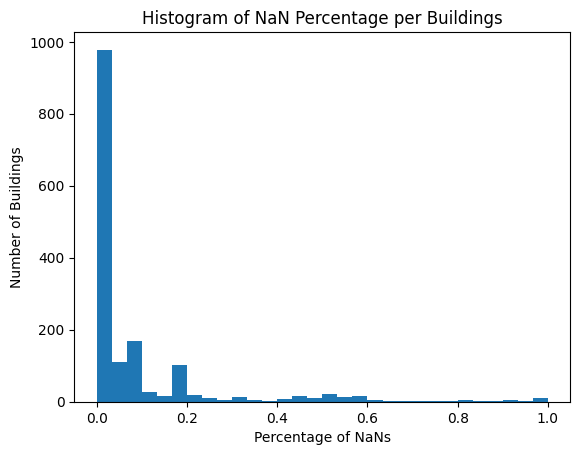

In [111]:
# Count number of missing values in each building
(df.isna().sum()/len(df)).plot(kind='hist', bins=30)
plt.title('Histogram of NaN Percentage per Buildings')
plt.xlabel('Percentage of NaNs')
plt.ylabel('Number of Buildings')
plt.show()

In [112]:
# Number of buildings with missing values > 40%
((df.isna().sum()/len(df))>0.4).sum()

np.int64(123)

### 1st filtering by removing buildings with more than 40% NaN values

In [113]:
mask = (df.isna().sum() / len(df)) <= 0.4
filtered_df = df.loc[:, mask]
filtered_df

,Panther_parking_Lorriane,Panther_lodging_Cora,Panther_office_Hannah,Panther_lodging_Hattie,Panther_education_Teofila,Panther_education_Jerome,Panther_retail_Felix,Panther_parking_Asia,Panther_education_Misty,Panther_retail_Gilbert,...,Cockatoo_education_Amira,Cockatoo_public_Harland,Cockatoo_public_Caleb,Cockatoo_education_Tyler,Cockatoo_public_Shad,Mouse_health_Modesto,Mouse_lodging_Vicente,Mouse_health_Justin,Mouse_health_Ileana,Mouse_health_Estela
timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,38.025,26.200,123.200,727.575,69.200,370.0870,10.0,282.9965,26.0,135.0
2016-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,38.175,25.250,126.475,731.200,66.275,737.8260,30.0,574.9265,51.0,265.0
2016-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,38.125,23.850,127.825,724.675,64.675,729.9255,30.0,570.2780,50.0,272.0
2016-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,37.800,24.400,130.475,737.375,65.875,722.2620,20.0,561.1470,52.0,276.0
2016-01-01 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,37.975,28.275,129.675,721.150,66.275,719.1665,30.0,564.3695,50.0,280.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-31 19:00:00,15.4830,135.2261,3.4357,79.1353,105.6374,465.0898,67.0199,35.7069,16.3231,0.6401,...,38.750,23.925,96.925,704.950,111.350,NaN,NaN,NaN,NaN,NaN
2017-12-31 20:00:00,12.7224,135.9262,3.4087,81.6958,107.7348,463.6895,56.6869,35.7069,16.0831,0.7301,...,38.750,23.600,97.550,695.700,115.875,NaN,NaN,NaN,NaN,NaN
2017-12-31 21:00:00,11.2822,135.1761,3.3546,82.8160,106.1295,461.2890,55.0576,35.5068,16.1631,0.7201,...,38.875,24.425,93.825,687.325,111.650,NaN,NaN,NaN,NaN,NaN


In [114]:
def drop_columns_with_window(df, window_size, value_count):
    valid_cols = []

    for col in df.columns:
        valid_counts = df[col].notna().rolling(window=window_size, min_periods=window_size).sum()
        start_of_value_counts = window_size-1
        if (valid_counts[start_of_value_counts:] >= value_count).all():
            valid_cols.append(col)

    return df[valid_cols]

### 2nd filtering by removing buildings with less than 2 records in 24h rolling window

In [115]:
filtered_df2 = drop_columns_with_window(filtered_df, window_size=168, value_count=120)  # One week


In [116]:
filtered_df2.shape

(17544, 734)

### Calculate number of buildings in each Categories Again

In [139]:
site_dict_2 = {}
usage_dict_2 = {}
site_usage_dict_2 = {}
for col in filtered_df2.columns.to_list():
    site, usage , _ = col.split('_')
    
    if site in site_dict_2.keys():
        site_dict_2[site] += 1
    else:
        site_dict_2[site] = 1
        
    if usage in usage_dict_2.keys():
        usage_dict_2[usage] += 1
    else:
        usage_dict_2[usage] = 1
    
    if site+"_"+usage in site_usage_dict_2.keys():
        site_usage_dict_2[site+"_"+usage] += 1
    else:
        site_usage_dict_2[site+"_"+usage] = 1

In [140]:
site_dict_2

{'Robin': 50,
 'Fox': 116,
 'Rat': 184,
 'Bear': 74,
 'Lamb': 77,
 'Peacock': 34,
 'Moose': 6,
 'Wolf': 31,
 'Hog': 117,
 'Eagle': 45}

In [141]:
usage_dict_2

{'public': 87,
 'lodging': 56,
 'education': 294,
 'office': 148,
 'assembly': 83,
 'retail': 4,
 'warehouse': 7,
 'food': 3,
 'utility': 2,
 'parking': 12,
 'health': 15,
 'other': 7,
 'religion': 1,
 'science': 3,
 'industrial': 8,
 'services': 4}

In [142]:
site_usage_dict_2

{'Robin_public': 2,
 'Robin_lodging': 10,
 'Robin_education': 22,
 'Robin_office': 15,
 'Robin_assembly': 1,
 'Fox_lodging': 12,
 'Fox_education': 50,
 'Fox_office': 22,
 'Fox_retail': 1,
 'Fox_assembly': 17,
 'Fox_warehouse': 1,
 'Fox_food': 2,
 'Fox_utility': 1,
 'Fox_public': 6,
 'Fox_parking': 3,
 'Fox_health': 1,
 'Rat_public': 62,
 'Rat_retail': 1,
 'Rat_office': 15,
 'Rat_assembly': 31,
 'Rat_education': 56,
 'Rat_other': 3,
 'Rat_religion': 1,
 'Rat_warehouse': 3,
 'Rat_health': 4,
 'Rat_lodging': 7,
 'Rat_parking': 1,
 'Bear_public': 5,
 'Bear_education': 58,
 'Bear_science': 2,
 'Bear_lodging': 3,
 'Bear_parking': 2,
 'Bear_assembly': 3,
 'Bear_utility': 1,
 'Lamb_education': 41,
 'Lamb_health': 1,
 'Lamb_office': 9,
 'Lamb_public': 3,
 'Lamb_assembly': 18,
 'Lamb_other': 1,
 'Lamb_industrial': 3,
 'Lamb_lodging': 1,
 'Peacock_office': 7,
 'Peacock_lodging': 10,
 'Peacock_education': 13,
 'Peacock_assembly': 3,
 'Peacock_public': 1,
 'Moose_education': 6,
 'Wolf_education': 1

In [143]:
cleaned_df = filtered_df2.ffill().bfill()

In [144]:
import os

export_dir = '../Cleaned Data Set'
os.makedirs(export_dir, exist_ok=True)

export_path = os.path.join(export_dir, 'cleaned_data_set.csv')
cleaned_df.to_csv(export_path)

# EDA

In [155]:
sitbuildloc = cleaned_df.columns.to_series().str.extract(r'(?P<site>[^_]+)_(?P<building>[^_]+)_(?P<location>.+)')
sitbuildloc.index = cleaned_df.columns

In [156]:
sitbuildloc

,site,building,location
Robin_public_Carolina,Robin,public,Carolina
Robin_lodging_Dorthy,Robin,lodging,Dorthy
Robin_education_Zenia,Robin,education,Zenia
Robin_office_Dina,Robin,office,Dina
Robin_education_Derick,Robin,education,Derick
...,...,...,...
Eagle_lodging_Trina,Eagle,lodging,Trina
Eagle_health_Amy,Eagle,health,Amy
Eagle_education_Teresa,Eagle,education,Teresa
Eagle_office_Patrice,Eagle,office,Patrice


## Anomaly

In [164]:
# Anomalies in the original data within 1 week window

rolling_mean = cleaned_df.rolling(window=168, min_periods=84).mean()
rolling_std = cleaned_df.rolling(window=168, min_periods=84).std()
rolling_z = (cleaned_df - rolling_mean) / rolling_std
rolling_anomalies = rolling_z.abs() > 3

In [165]:
sitbuildloc['anomaly_count'] = rolling_anomalies.sum()

anomaly_by_building = sitbuildloc.groupby('building')['anomaly_count'].sum().sort_values(ascending=False)

mean_anomaly_by_building = sitbuildloc.groupby('building')['anomaly_count'].mean().sort_values(ascending=False)

mean_anomaly_by_building

building
food          196.000000
other         171.000000
services      168.750000
assembly      132.602410
science       130.333333
lodging       121.928571
education     115.292517
industrial    112.500000
public         90.896552
warehouse      86.571429
office         73.135135
retail         67.000000
religion       62.000000
health         61.800000
parking        57.166667
utility        28.500000
Name: anomaly_count, dtype: float64

In [ ]:
anomaly_flags = rolling_anomalies.any(axis=1).astype(int) # 1 if anomaly, 0 if not
anomaly_flags.index = cleaned_df.index


In [167]:
anomaly_df = pd.DataFrame({'anomaly': anomaly_flags})
anomaly_df['hour'] = anomaly_df.index.hour
anomaly_df['weekday'] = anomaly_df.index.dayofweek  # 0 = Monday, 6 = Sunday
anomaly_df['month'] = anomaly_df.index.month

In [ ]:
hourly_anomalies = anomaly_df.groupby('hour')['anomaly'].mean().reset_index()
weekday_anomalies = anomaly_df.groupby('weekday')['anomaly'].mean().reset_index()
monthly_anomalies = anomaly_df.groupby('month')['anomaly'].mean().reset_index()

In [178]:
import plotly.express as px

fig = px.bar(hourly_anomalies, x='hour', y='anomaly',
             title='Anomaly Frequency by Hour of Day',
             labels={'anomaly': 'Avg Anomaly Rate'})
fig.update_layout(
    xaxis_title='Hour of Day',
    yaxis_title='Anomaly Rate',
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(24)),
        ticktext=list(range(1, 25))
    )
)
fig.show()


In [177]:
fig = px.bar(weekday_anomalies, x='weekday', y='anomaly',
             title='Anomaly Frequency by Day of Week',
             labels={'anomaly': 'Anomaly Rate'})
fig.update_layout(xaxis=dict(
    tickmode='array',
    tickvals=list(range(7)),
    ticktext=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
))
fig.show()


In [176]:
fig = px.line(monthly_anomalies, x='month', y='anomaly',
              title='Anomaly Frequency by Month of Year',
              labels={'anomaly': 'Avg Anomaly Rate'})
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Anomaly Rate',
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(1, 13)),
        ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    )
)
fig.show()

In [183]:
# Count of buildings per type
building_counts = sitbuildloc.groupby('building').size()

# Mean anomaly rate per building type
anomaly_rate_by_type = (anomaly_by_building / building_counts).sort_values(ascending=False)

fig = px.bar(
    anomaly_rate_by_type.reset_index(),
    x='building',
    y=0,
    title='Mean Anomalies per Building by Type (Normalized)',
    labels={'building': 'Building Type', 0: 'Mean Anomalies per Site'}
)
fig.update_layout(xaxis_title='Building Type', yaxis_title='Mean Anomalies')
fig.show()

## Average energy usage by buildings

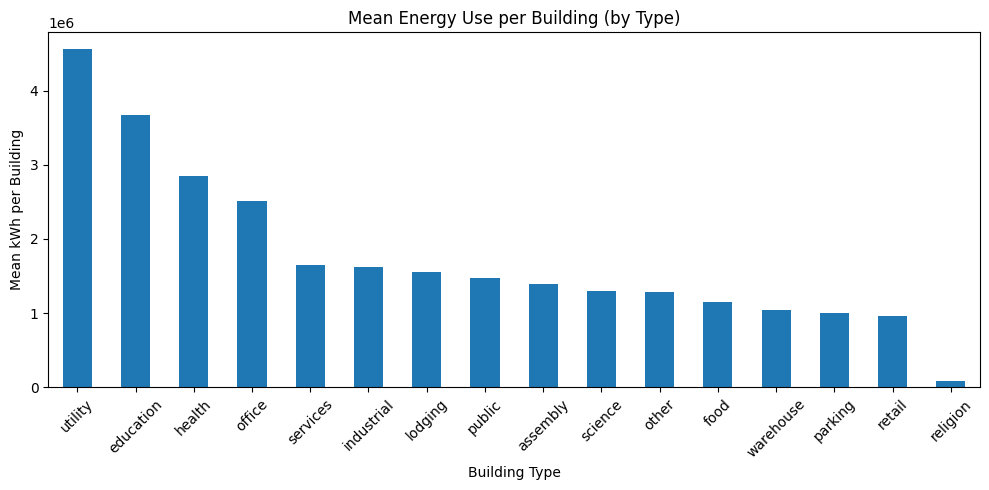

In [147]:
total_by_col = cleaned_df.sum()
sitbuildloc['total_kwh'] = total_by_col

mean_by_type = sitbuildloc.groupby('building')['total_kwh'].mean().sort_values(ascending=False)

plt.figure(figsize=(10, 5))
mean_by_type.plot(kind='bar')
plt.title("Mean Energy Use per Building (by Type)")
plt.ylabel("Mean kWh per Building")
plt.xlabel("Building Type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Melt for long-form
df_EDA = cleaned_df.copy()
df_EDA['timestamp'] = df_EDA.index
df_melted = df_EDA.melt(id_vars='timestamp', var_name='column', value_name='value')
df_melted = df_melted.join(sitbuildloc, on='column')

mean_by_time_building = (
    df_melted.groupby(['timestamp', 'building'])['value']
    .mean()
    .reset_index()
)

In [ ]:

smoothed_frames = []

for bldg_type in mean_by_time_building['building'].unique():
    sub_df = mean_by_time_building[mean_by_time_building['building'] == bldg_type].copy()
    sub_df = sub_df.set_index('timestamp').sort_index()

    sub_df['value'] = sub_df['value'].rolling(window=24, min_periods=1).mean()
    sub_df = sub_df.reset_index()
    sub_df['building'] = bldg_type

    smoothed_frames.append(sub_df)
mean_by_time_building_smoothed = pd.concat(smoothed_frames, ignore_index=True)

fig = px.line(
    mean_by_time_building_smoothed,
    x='timestamp',
    y='value',
    color='building',
    title='Mean Energy Use Over Time by Building Type (24-Hour Rolling Avg)'
)
fig.update_layout(legend_title_text='Building Type')
fig.show()


In [ ]:

df_EDA['hour'] = df_EDA['timestamp'].dt.hour
df_EDA['weekday'] = df_EDA['timestamp'].dt.dayofweek

hourly_avg = df_melted.copy()
hourly_avg['hour'] = hourly_avg['timestamp'].dt.hour

hourly_by_type = hourly_avg.groupby(['hour', 'building'])['value'].mean().reset_index()

fig = px.line(
    hourly_by_type,
    x='hour',
    y='value',
    color='building',
    markers=True,
    title='Average Hourly Energy Use by Building Type'
)

fig.update_layout(
    xaxis=dict(title='Hour of Day', tickmode='linear', tick0=0, dtick=1),
    yaxis_title='kWh',
    legend_title='Building Type',
    template='plotly_white',
    hovermode='x unified',
    width=1000,
    height=500
)

fig.show()

